<a href="https://colab.research.google.com/github/melihkurtaran/ImageAnalysisProject/blob/main/ImageProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Dowloading and Importing Libraries**

In [ ]:
!pip install --upgrade scikit-image

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install pixelmatch

In [138]:
import cv2
import numpy as np
import pandas as pd
import os
import glob
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
from PIL import Image
from pixelmatch.contrib.PIL import pixelmatch
from numpy import asarray

# **GitHub Data Access**

In [1]:
!git clone https://github.com/melihkurtaran/ImageAnalysisProject.git

Cloning into 'ImageAnalysisProject'...
remote: Enumerating objects: 31, done.
remote: Counting objects: 100% (31/31), done.
remote: Compressing objects: 100% (26/26), done.
remote: Total 31 (delta 4), reused 28 (delta 4), pack-reused 0
Unpacking objects: 100% (31/31), done.


In [8]:
# storing the images in data folder
image_files = glob.glob ("ImageAnalysisProject/data/*.jpg")
image_files

['ImageAnalysisProject/data/1660474800.jpg',
 'ImageAnalysisProject/data/1660471200.jpg',
 'ImageAnalysisProject/data/1660453200.jpg',
 'ImageAnalysisProject/data/1660485600.jpg',
 'ImageAnalysisProject/data/1660467600.jpg',
 'ImageAnalysisProject/data/1660464000.jpg',
 'ImageAnalysisProject/data/1660456800.jpg',
 'ImageAnalysisProject/data/1660478400.jpg',
 'ImageAnalysisProject/data/1660482000.jpg',
 'ImageAnalysisProject/data/1660460400.jpg']

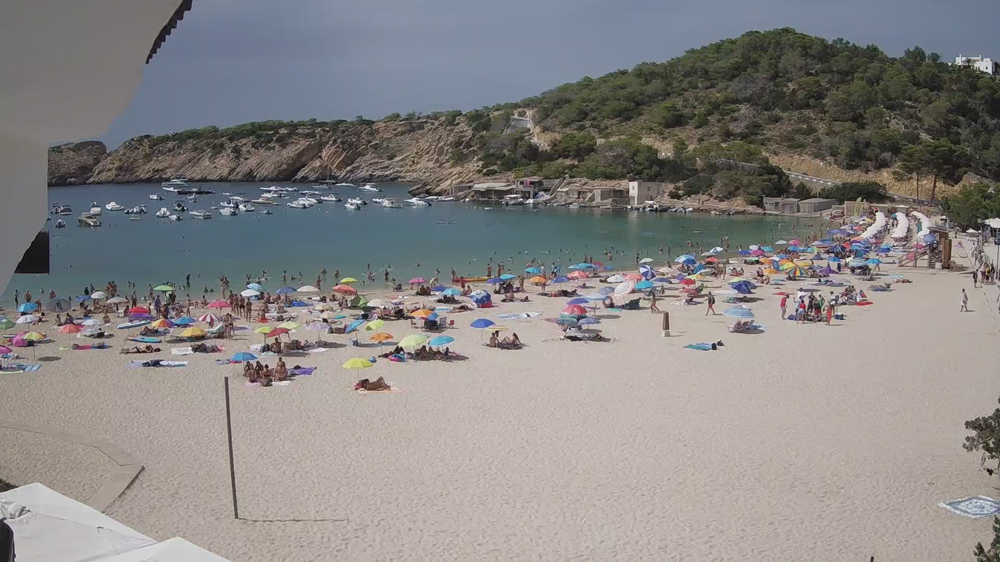

In [9]:
# An example of an image
img = cv2.imread(image_files[3], 1)
cv2_imshow(img)

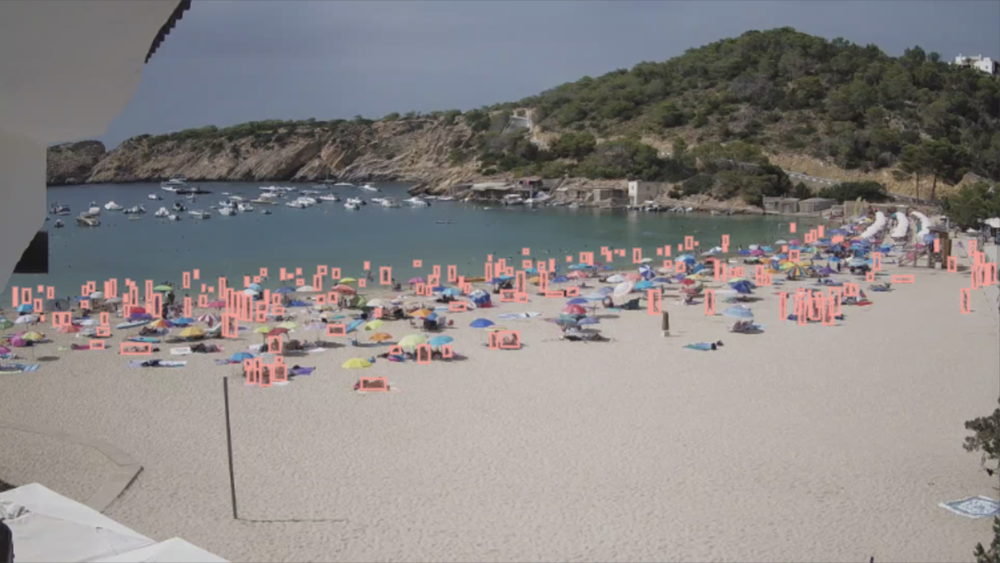

In [7]:
#An example of annotated version of the image
ann_images = glob.glob ("ImageAnalysisProject/annotated_examples/*.jpg")
a_img = cv2.imread(ann_images[2], 1)
cv2_imshow(a_img)

In [16]:
#Get label csv
df_labels = pd.read_csv('ImageAnalysisProject/personLabels.csv')
df_labels.sample(10)

,label_name,bbox_x,bbox_y,bbox_width,bbox_height,image_name,image_width,image_height
461,Person,647,612,12,28,1660478400.jpg,1920,1080
826,Person,527,567,11,17,1660485600.jpg,1920,1080
372,Person,384,530,11,20,1660474800.jpg,1920,1080
377,Person,788,506,11,28,1660474800.jpg,1920,1080
478,Person,279,549,3,2,1660478400.jpg,1920,1080
810,Person,614,513,13,13,1660485600.jpg,1920,1080
110,Person,1159,496,9,18,1660467600.jpg,1920,1080
50,Person,1336,495,14,34,1660464000.jpg,1920,1080
811,Person,643,519,10,15,1660485600.jpg,1920,1080
451,Person,293,559,9,45,1660478400.jpg,1920,1080


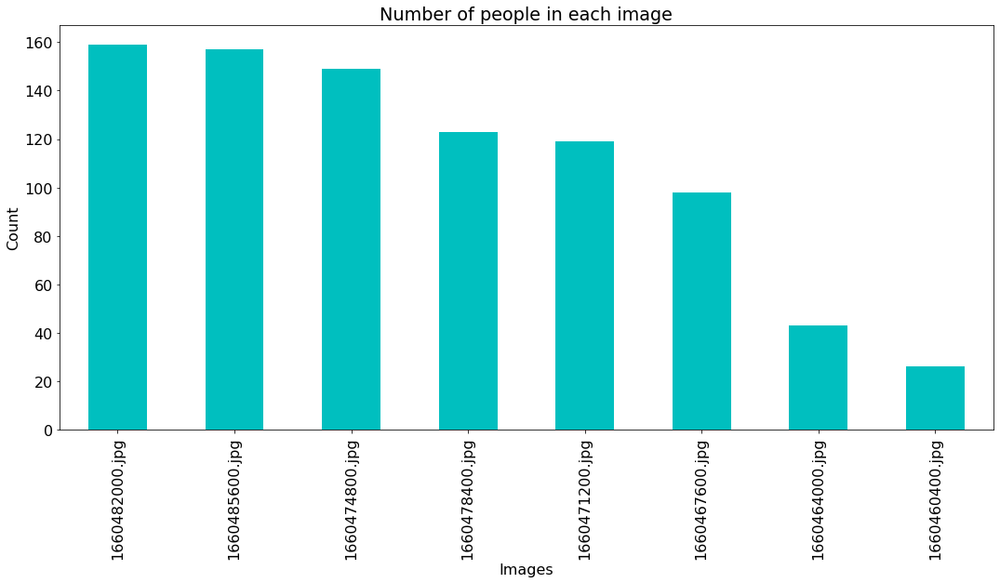

In [46]:
plt.figure()
plt.rcParams.update({'font.size': 16})
df_labels['image_name'].value_counts().plot(kind='bar',color="c",figsize=(18, 8),
                                            title="Number of people in each image",
                                            xlabel="Images", ylabel="Count")

In [11]:
#Image Files to Images
images = []
for fil in image_files:
    i = cv2.imread(fil, 1)
    images.append(i)
print("Images are ready to use")


Images are ready to use


# **Image Processing**

Several Techniques

## **Image Averaging**

Trying image averaging on two examples with one bright and one darker one

In [88]:
# Image 2 and Image 6 are the empty images so they will be used for averaging

#image 2 (darrkish empty)
d_empty_img = images[2]

#image 6 (brigthish empty)
b_empty_img = images[6]

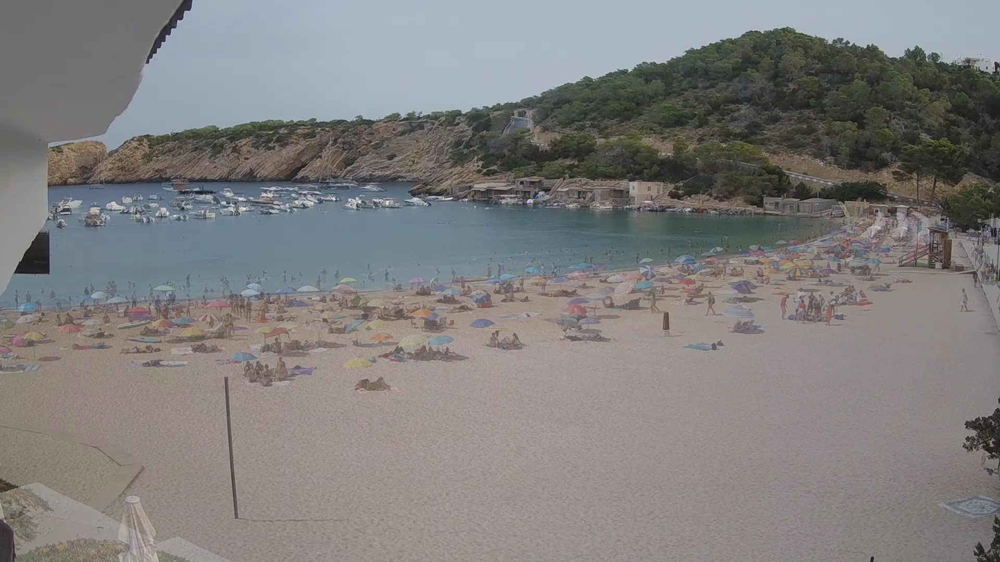

In [89]:
# Bright image example (images[3])

alpha = 0.4
beta = 1.0 - alpha

avg_image = images[3]
avg_image = cv2.addWeighted(images[3], alpha, b_empty_img, beta, 0.0)
cv2_imshow(avg_image)

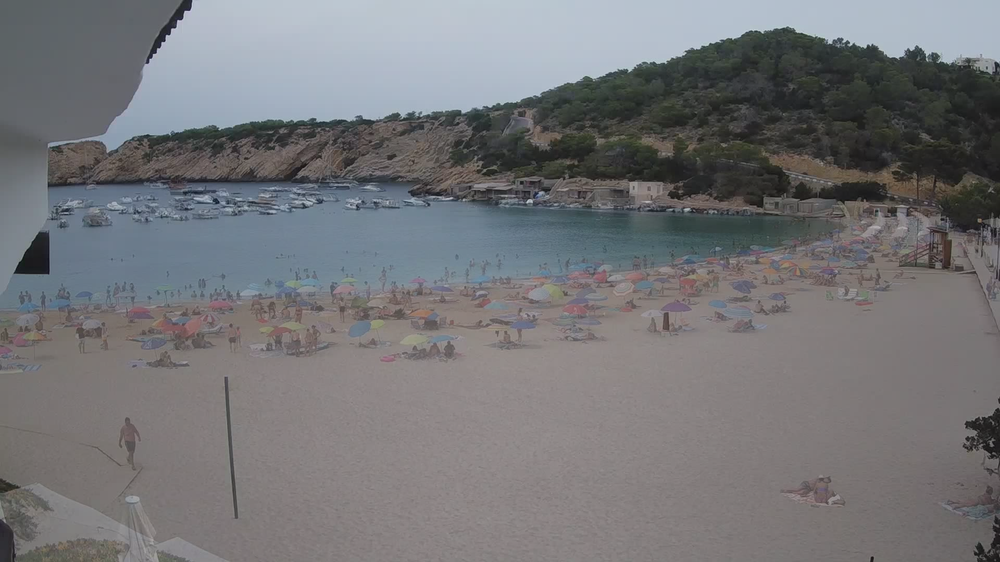

In [90]:
# Darker image example (images[8])

alpha = 0.4
beta = 1.0 - alpha

avg_image = images[8]

avg_image = cv2.addWeighted(images[8], alpha, d_empty_img, beta, 0.0)
cv2_imshow(avg_image)

## **Pixel-wise Comparison**

number of mismatched pixels 253993


(-0.5, 1919.5, 1079.5, -0.5)

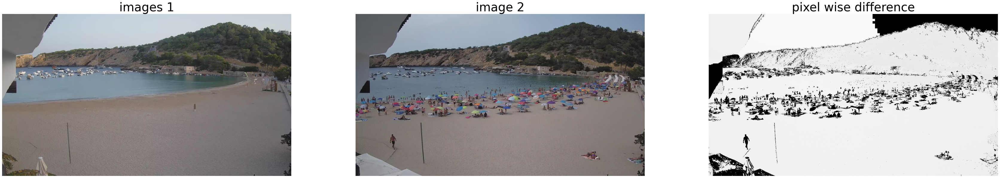

In [135]:
image1 = Image.open("/content/ImageAnalysisProject/data/1660456800.jpg")
image2 = Image.open("/content/ImageAnalysisProject/data/1660482000.jpg")

# Pixel-wise differences between two images are stored in "img_diff."
size = (1920,1080)
img_diff = Image.new("RGBA", size)
mismatch = pixelmatch(image1, image2, img_diff, threshold=0.15,includeAA=True,diff_color=[0, 0, 0])
print("number of mismatched pixels {}".format(mismatch))

# displaying results
fig = plt.figure(figsize=(60, 10))

#original image 1
plt.subplot(1, 3, 1)
plt.imshow(image1)
plt.title("images 1", fontsize=40)
plt.axis('off')

#original image 2
plt.subplot(1, 3, 2)
plt.imshow(image2)
plt.title("image 2", fontsize=40)
plt.axis('off')

plt.subplot(1, 3, 3)
#difference map
plt.imshow(img_diff)
plt.title("pixel wise difference", fontsize=40)
plt.axis('off')


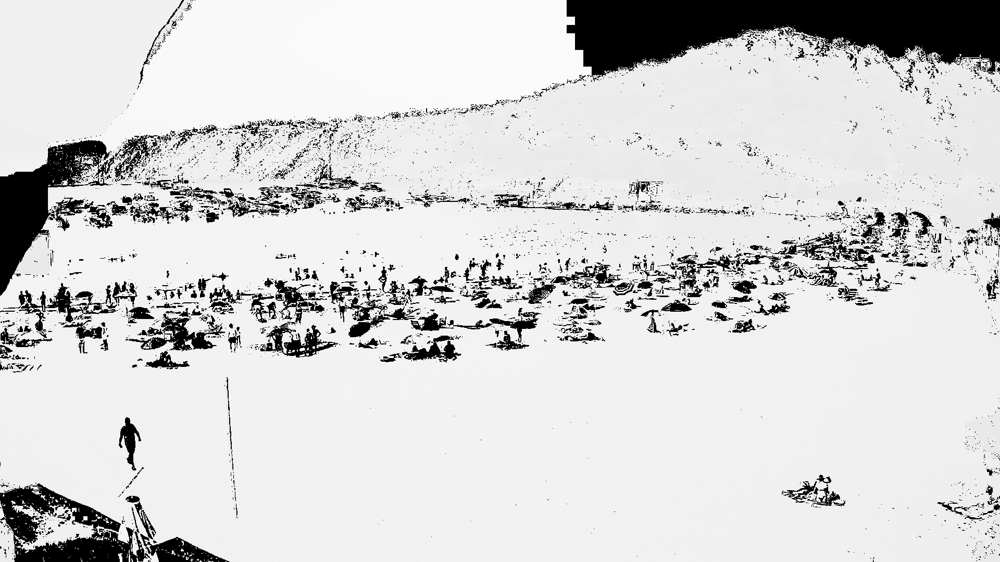

In [137]:
img_dif = asarray(img_diff)
cv2_imshow(img_dif)